- Show image pixel distributions
- Crop and pad images into a standard size, say 500x500px
- Show bounding box annotation along with the image



Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Install Dependencies



In [ ]:
!pip install torch torchvision pandas matplotlib json

ERROR: Could not find a version that satisfies the requirement json (from versions: none)
ERROR: No matching distribution found for json


Navigate to dataset folder

In [ ]:
import os
dataset_path = "/content/drive/MyDrive/oral-cancer-screening-dataset"
os.listdir(dataset_path)

['Annotation.json',
 'Patientwise_Data.csv',
 'Imagewise_Data.csv',
 'sample images']

In [ ]:
import pandas as pd

imagewise_df = pd.read_csv(os.path.join(dataset_path, "Imagewise_Data.csv"))
patientwise_df = pd.read_csv(os.path.join(dataset_path, "Patientwise_Data.csv"))

print("Imagewise Data:\n", imagewise_df.head())
print("Patientwise Data:\n", patientwise_df.head())


Imagewise Data:
   Image Name Category Clinical Diagnosis  Lesion Annotation Count
0    R-01-01     OPMD        Leukoplakia                        1
1    R-01-02     OPMD        Leukoplakia                        1
2    R-01-03   Benign      Coated Tongue                        1
3    R-02-01   Benign                VBD                        1
4    R-02-02   Benign                VBD                        1
Patientwise Data:
   Patient ID  Age Gender Smoking Chewing_Betel_Quid  Alcohol  Image Count
0       R-01   63      M      No                  No      No            3
1       R-02   17      F      No                  No      No            8
2       R-03   70      M      No                  No      No            5
3       R-04   45      M      No                  No      No            5
4       R-05   46      M      No                 Yes      No            2


**Show image pixel distributions**



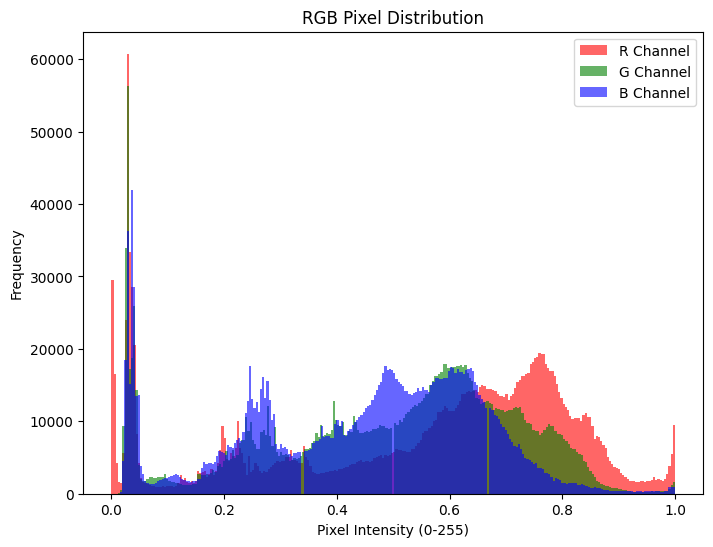

In [ ]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load image and convert to PyTorch tensor
image_path = "/content/drive/MyDrive/oral-cancer-screening-dataset/sample images/C-3-6-1.jpg"
image = Image.open(image_path).convert("RGB")  # Load as RGB

# Convert to tensor
transform = transforms.ToTensor()
image_tensor = transform(image)  # Shape: (3, H, W)

# Convert tensor to NumPy array for visualization
image_np = image_tensor.numpy()

# Plot histogram for each channel (R, G, B)
colors = ['r', 'g', 'b']
plt.figure(figsize=(8, 6))
for i, color in enumerate(colors):
    plt.hist(image_np[i].ravel(), bins=256, color=color, alpha=0.6, label=f'{color.upper()} Channel')

plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.title("RGB Pixel Distribution")
plt.legend()
plt.show()


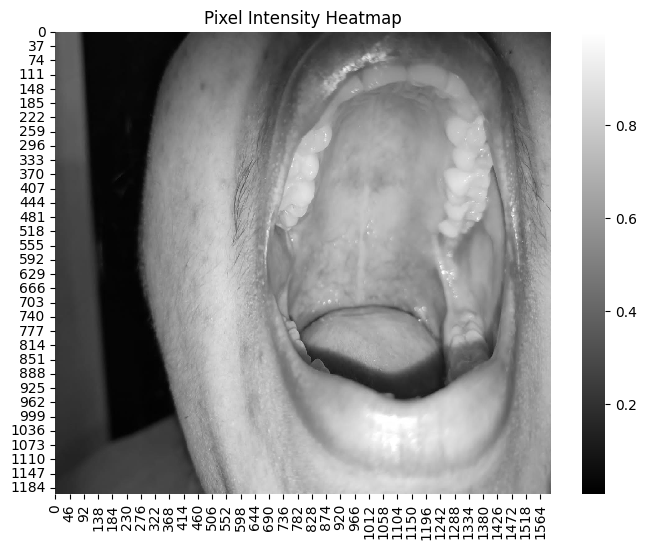

In [ ]:
import seaborn as sns
import numpy as np

# Convert to Grayscale
grayscale_transform = transforms.Grayscale()
gray_image = grayscale_transform(image_tensor)  # Shape: (1, H, W)

# Convert to NumPy
gray_np = gray_image.squeeze().numpy()  # Remove single-channel dimension

# Plot heatmap
plt.figure(figsize=(8,6))
sns.heatmap(gray_np, cmap='gray')
plt.title("Pixel Intensity Heatmap")
plt.show()


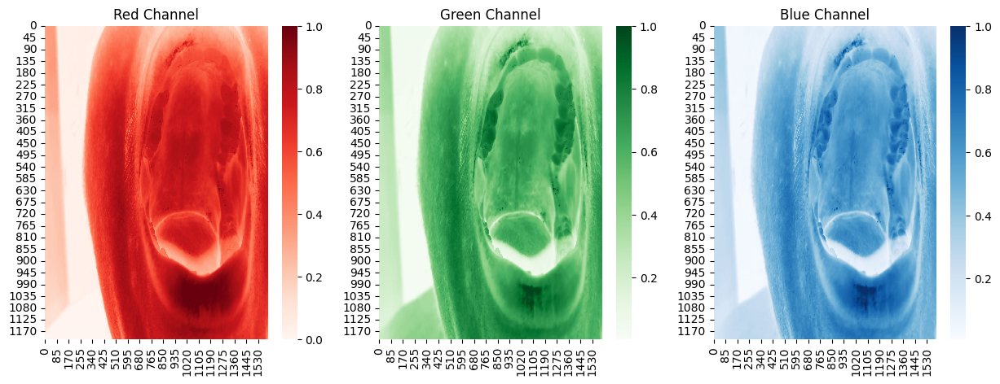

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
channel_names = ['Red', 'Green', 'Blue']
colormaps = ['Reds', 'Greens', 'Blues']  # colormaps corresponding to channels
for i, ax in enumerate(axes):
    sns.heatmap(image_np[i], cmap=colormaps[i], ax=ax)
    ax.set_title(f"{channel_names[i]} Channel")

plt.show()


**Crop and pad images into a standard size, say 500x500px**

width 1600
height 1200
torch.Size([3, 500, 500])


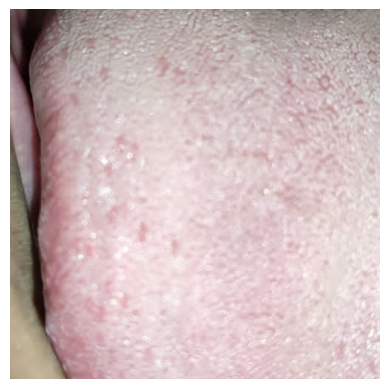

In [ ]:
import torchvision.transforms as transforms
from PIL import Image

# Load image
image_path = "/content/drive/MyDrive/oral-cancer-screening-dataset/sample images/C-3-7-3.jpg"
image = Image.open(image_path)

# Get image dimensions
width, height = image.size
print('width',width)
print('height',height)

crop_transform = transforms.CenterCrop(500)
processed_image = crop_transform(image)

to_tensor_transform = transforms.ToTensor()
image_tensor = to_tensor_transform(processed_image)
print(image_tensor.shape)

processed_image_np = np.array(processed_image)

plt.imshow(processed_image_np)
plt.axis('off')
plt.show()

actual width 1600
actual height 1200
padded width 500
padded height 500


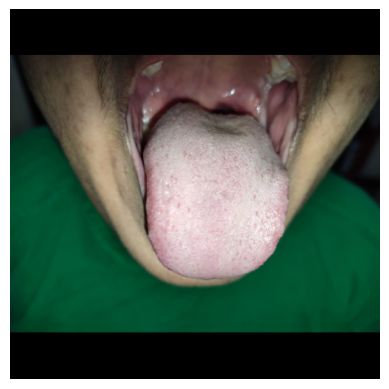

In [ ]:
import torchvision.transforms as transforms
from PIL import Image

# Load image
image_path = "/content/drive/MyDrive/oral-cancer-screening-dataset/sample images/C-3-7-3.jpg"
image = Image.open(image_path)

# Get image dimensions
width, height = image.size
print('actual width',width)
print('actual height',height)
target_size = 500

# since width > height:
new_width = target_size
new_height = int((target_size / width) * height)

# Apply resizing
resize_transform = transforms.Resize((new_height, new_width))
resized_image = resize_transform(image)

transform = transforms.Compose([
    transforms.Resize(500),  # Resize shorter side to 500
    transforms.Pad((max(0, (500 - image.width) // 2), max(0, (500 - image.height) // 2)), fill=0)  # Pad to 500x500
])

# Calculate padding
pad_left = (target_size - new_width) // 2
pad_top = (target_size - new_height) // 2
pad_right = target_size - new_width - pad_left
pad_bottom = target_size - new_height - pad_top

# Apply padding
pad_transform = transforms.Pad((pad_left, pad_top, pad_right, pad_bottom), fill=0)
padded_image = pad_transform(resized_image)

width, height = padded_image.size
print('padded width',width)
print('padded height',height)

plt.imshow(padded_image)
plt.axis('off')
plt.show()

**Show bounding box annotation along with the image**

[{'id': 1, 'file_name': 'R-01-01.jpg'}, {'id': 2, 'file_name': 'R-01-02.jpg'}, {'id': 3, 'file_name': 'R-01-03.jpg'}, {'id': 4, 'file_name': 'R-02-01.jpg'}, {'id': 5, 'file_name': 'R-02-02.jpg'}]
R-02-02.jpg
{'id': 1, 'file_name': 'R-01-01.jpg'}
[([2574, 1739, 464, 562], 1), ([860, 9, 3735, 3433], 2)]


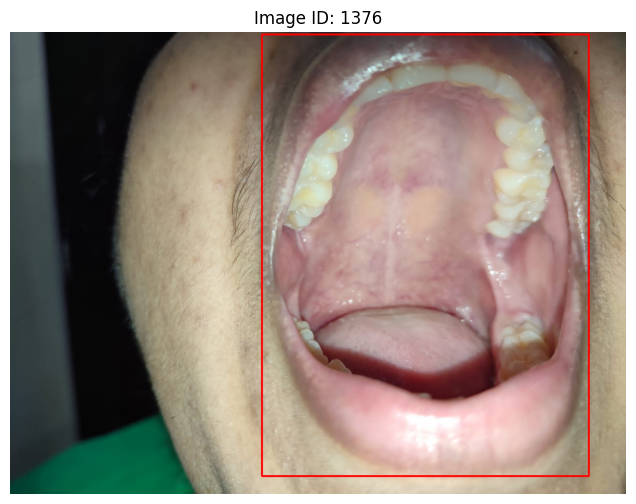

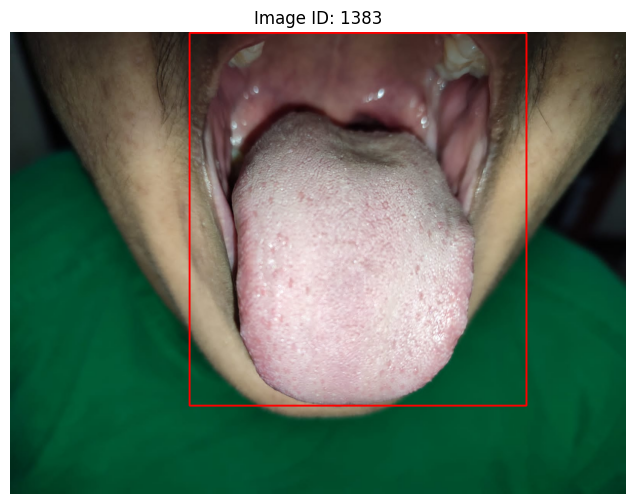

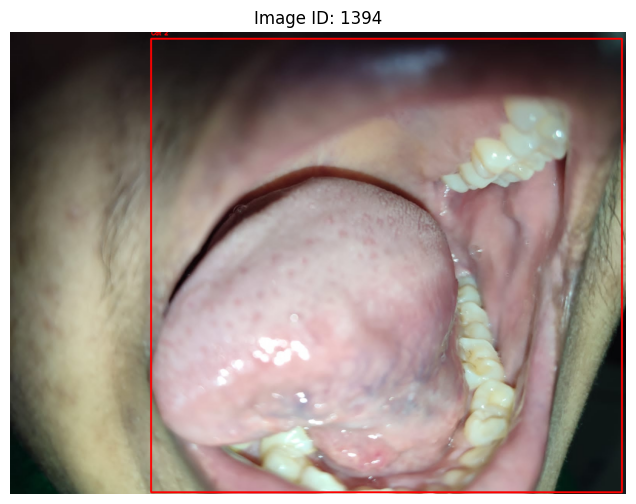

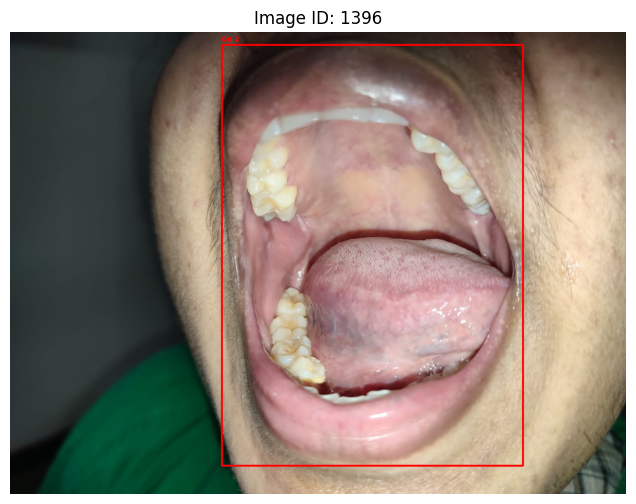

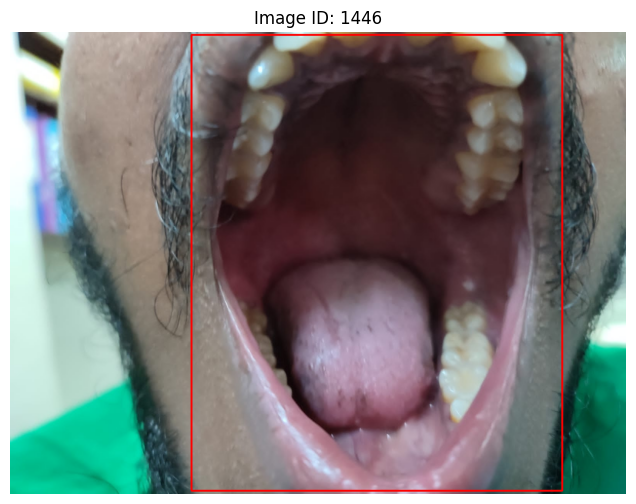

...

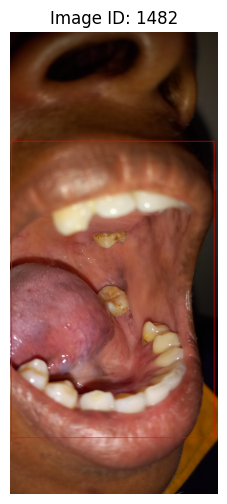

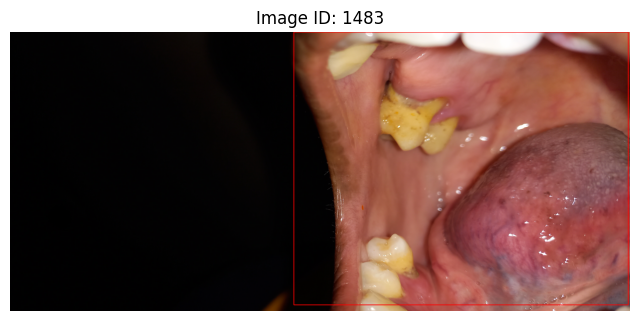

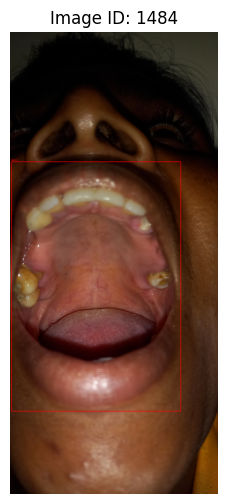

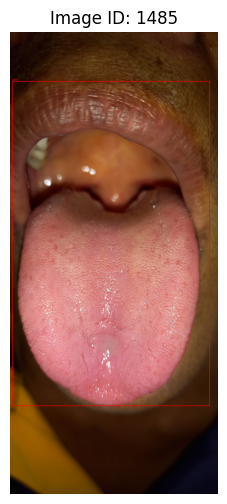

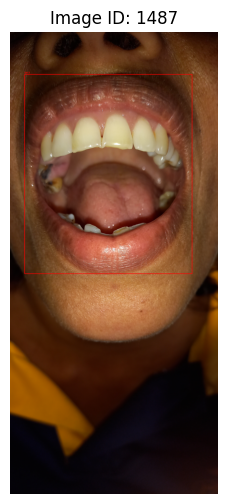

In [55]:
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import json

image_folder = "/content/drive/MyDrive/oral-cancer-screening-dataset/sample images"

# Load the annotation file
annotation_path = "/content/drive/MyDrive/oral-cancer-screening-dataset/Annotation.json"

with open(annotation_path, "r") as f:
    annotations = json.load(f)

# Print first few images
print(annotations["images"][:5])  # Display first 5 entries

# Create a mapping from image_id to file_name
image_info = {img["id"]: img["file_name"] for img in annotations["images"]}
print(image_info[5])
print(annotations["images"][0])

annotations = annotations["annotations"]

#Store all bounding boxes per image_id
image_bboxes = {}

for ann in annotations:
    image_id = ann["image_id"]
    bbox = ann["bbox"]  # [x, y, width, height]
    category_id = ann["category_id"]  # Object category

    if image_id not in image_bboxes:
        image_bboxes[image_id] = []

    image_bboxes[image_id].append((bbox, category_id))

print(image_bboxes[1])

#Draw bounding boxes
for image_id, bboxes in image_bboxes.items():
    # Get image filename
    if image_id not in image_info:
        continue

    image_path = os.path.join(image_folder, image_info[image_id])

    if not os.path.exists(image_path):
        continue

    # Load image
    image = cv2.imread(image_path)
    if image is None:
        continue

  # Convert color for Matplotlib
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw all bounding boxes for this image
    for bbox, category_id in bboxes:
        x, y, w, h = map(int, bbox)
        cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 3)  # Blue box
        cv2.putText(image, f"Cat {category_id}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Display image with bounding boxes
    plt.figure(figsize=(8, 6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image ID: {image_id}")
    plt.show()